# Penerapan Metode Augmentasi Data Pada Klasifikasi Jenis Buah Untuk Peningkatan Hasil Akurasi Menggunakan Model Convolutional Neural Network


*   MUHAMMAD BIMA AL FAYYADL 201810370311131
*   WANA SALMA LABIBAH       201810370311118




In [ ]:
from google.colab import files
files.upload()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install kaggle
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download moltean/fruits

 99% 1.28G/1.28G [00:14<00:00, 88.2MB/s]
100% 1.28G/1.28G [00:14<00:00, 92.7MB/s]


In [ ]:
!unzip fruits.zip

Streaming output truncated to the last 5000 lines.
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/111_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/112_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/113_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/114_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/115_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/116_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/117_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/119_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/120_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/121_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/122_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/123_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Traini

In [ ]:
!mkdir "/content/drive/MyDrive/dataset/dataset_split"

In [ ]:
!pip install split-folders

In [ ]:
import splitfolders  # or import split_folders

# Split with a ratio.
# To only split into training and validation set, set a tuple to `ratio`, i.e, `(.8, .2)`.
splitfolders.ratio("/content/drive/MyDrive/dataset/Dataset", output="/content/drive/MyDrive/dataset/dataset_split", seed=1337, ratio=(.8, .2), group_prefix=None) # default values

Copying files: 13349 files [43:29,  5.12 files/s]


In [ ]:
# TULIS KODE ANDA DISINI
import os
#base_train_dir = "/content/fruits-360-original-size/fruits-360-original-size"
base_dir = "/content/drive/MyDrive/dataset/dataset_split"

#train_dir = os.path.join(base_train_dir, 'Training')
#test_dir = os.path.join(base_train_dir, 'Test')
#val_dir = os.path.join(base_train_dir, 'Validation')

train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
import tensorflow as tf

train_gen = datagen.flow_from_directory(train_dir, 
                                        target_size=(100, 100), 
                                        shuffle=False,
                                        class_mode='sparse'
)

#test_gen = datagen.flow_from_directory(test_dir, 
 #                                       color_mode="rgb", 
  #                                      target_size=(128, 128), 
   #                                     shuffle=False,
    #                                    class_mode='sparse'
#)

val_gen = datagen.flow_from_directory(val_dir, 
                                      target_size=(100, 100), 
                                      shuffle=False,
                                      class_mode='sparse'
)

Found 10668 images belonging to 25 classes.
Found 2681 images belonging to 25 classes.


In [ ]:
# Tulis Kode Anda Disini
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import InputLayer, Dense, Conv2D, MaxPool2D, Flatten, GlobalMaxPool2D, GlobalMaxPooling2D, BatchNormalization, Dropout

In [ ]:
# Feature Extraction Layer
model = Sequential()

model.add(InputLayer(input_shape=[100,100,3]))
model.add(Conv2D(filters=16, kernel_size=3, strides=1, padding='same', activation='relu'))
model.add(MaxPool2D(pool_size=2, padding='same'))
model.add(Conv2D(filters=32, kernel_size=3, strides=1, padding='same', activation='relu'))
model.add(MaxPool2D(pool_size=2, padding='same'))
model.add(Conv2D(filters=64, kernel_size=3, strides=1, padding='same', activation='relu'))
model.add(MaxPool2D(pool_size=2, padding='same'))
model.add(GlobalMaxPool2D(data_format='channels_last'))
model.add(Flatten())
model.add(Dense(2096, activation='relu'))
model.add(Dense(524, activation='relu'))
model.add(Dense(25, activation='softmax'))

In [ ]:
print(model.summary())

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 100, 100, 16)      448       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 50, 50, 16)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 50, 50, 32)        4640      
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 25, 25, 32)       0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 25, 25, 64)        18496     
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 13, 13, 64)      

In [ ]:
from tensorflow.keras.optimizers import Adam

model.compile(optimizer=Adam(lr=0.001), 
              loss='sparse_categorical_crossentropy', 
              metrics=['acc'])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
H1 = model.fit(train_gen, batch_size=32, epochs=90, validation_data=val_gen)

Epoch 1/90
334/334 [==============================] - 35s 104ms/step - loss: 0.0267 - acc: 0.9915 - val_loss: 0.0089 - val_acc: 0.9993
Epoch 2/90
334/334 [==============================] - 35s 105ms/step - loss: 0.0065 - acc: 0.9993 - val_loss: 0.0041 - val_acc: 0.9996
Epoch 3/90
334/334 [==============================] - 35s 105ms/step - loss: 0.0037 - acc: 0.9994 - val_loss: 0.0026 - val_acc: 1.0000
Epoch 4/90
334/334 [==============================] - 35s 105ms/step - loss: 0.0019 - acc: 0.9999 - val_loss: 0.0020 - val_acc: 1.0000
Epoch 5/90
334/334 [==============================] - 36s 106ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 0.0015 - val_acc: 1.0000
Epoch 6/90
334/334 [==============================] - 36s 107ms/step - loss: 8.9019e-04 - acc: 1.0000 - val_loss: 0.0011 - val_acc: 1.0000
Epoch 7/90
334/334 [==============================] - 35s 106ms/step - loss: 6.2187e-04 - acc: 1.0000 - val_loss: 0.0010 - val_acc: 1.0000
Epoch 8/90
334/334 [===========================

In [ ]:
from sklearn.metrics import classification_report
import numpy as np

testLab = val_gen.classes
pred = model.predict(val_gen)
y_pred = np.argmax(pred, axis=-1)

print(classification_report(y_pred, testLab))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        99
           1       1.00      1.00      1.00        96
           2       1.00      1.00      1.00        99
           3       1.00      1.00      1.00        97
           4       1.00      1.00      1.00        99
           5       1.00      1.00      1.00        99
           6       1.00      1.00      1.00        99
           7       1.00      1.00      1.00        86
           8       1.00      1.00      1.00        98
           9       1.00      1.00      1.00        99
          10       1.00      1.00      1.00       135
          11       1.00      1.00      1.00        99
          12       1.00      1.00      1.00       148
          13       1.00      1.00      1.00       148
          14       1.00      1.00      1.00        99
          15       1.00      1.00      1.00        99
          16       1.00      1.00      1.00        99
          17       1.00    

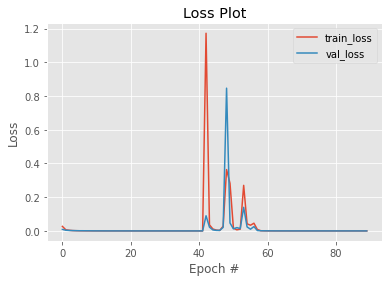

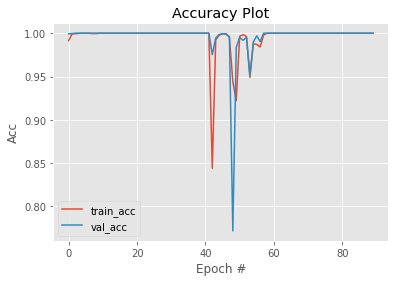

In [ ]:
%matplotlib inline

import matplotlib.pyplot as plt

plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, 90), H1.history["loss"], label="train_loss")
plt.plot(np.arange(0, 90), H1.history["val_loss"], label="val_loss")
plt.title("Loss Plot")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend()

plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, 90), H1.history["acc"], label="train_acc")
plt.plot(np.arange(0, 90), H1.history["val_acc"], label="val_acc")
plt.title("Accuracy Plot")
plt.xlabel("Epoch #")
plt.ylabel("Acc")
plt.legend()

plt.show()

In [ ]:
labels = []
for file in os.listdir(val_dir):
    d = os.path.join(val_dir, file)
    if os.path.isdir(d):
        labels.append(d.split(os.path.sep)[-1])

In [ ]:
import glob, random
image_rand = []

In [ ]:
input_size = (100,100)
channel = (3,)
input_shape = input_size + channel

In [ ]:
for x in image_rand:
  imgg = Image.open(x)
  X = preprocess(imgg,input_size)
  X = reshape([X])
  y = model.predict(X)
  plt.imshow(imgg)
  print( labels[np.argmax(y)], np.max(y) )

In [ ]:
labels = sorted(labels)

In [ ]:
labels

['Apple Braeburn',
 'Apple Golden 1',
 'Apple Golden 2',
 'Apple Golden 3',
 'Apple Granny Smith',
 'Apple Red 1',
 'Apple Red 2',
 'Apple Red 3',
 'Apple Red Delicious',
 'Apple Red Yellow 1',
 'Apple Red Yellow 2',
 'Cherry 1',
 'Cherry 2',
 'Cherry Rainier',
 'Cherry Wax Black',
 'Cherry Wax Red',
 'Cherry Wax Yellow',
 'Grape Blue',
 'Grape Pink',
 'Grape White',
 'Grape White 2',
 'Grape White 3',
 'Grape White 4',
 'Grapefruit Pink',
 'Grapefruit White']

In [ ]:
from PIL import Image

def predicts(x):
  imgg = Image.open(x)
  X = preprocess(imgg,input_size)
  X = reshape([X])
  y = model.predict(X)
  return ",predicted as " +  labels[np.argmax(y)] + ". with acc :"+ str(np.max(y))

In [ ]:
def preprocess(img,input_size):
    nimg = img.convert('RGB').resize(input_size, resample= 0)
    img_arr = (np.array(nimg))/255
    return img_arr
def reshape(imgs_arr):
    return np.stack(imgs_arr, axis=0)

In [ ]:
val_appleB_dir = os.path.join(val_dir, 'Apple Braeburn')
val_appleG1_dir = os.path.join(val_dir, 'Apple Golden 1')
val_appleG2_dir = os.path.join(val_dir, 'Apple Golden 2')
val_appleG3_dir = os.path.join(val_dir, 'Apple Golden 3')
val_appleGS_dir = os.path.join(val_dir, 'Apple Granny Smith')
val_appleR1_dir = os.path.join(val_dir, 'Apple Red 1')
val_appleR2_dir = os.path.join(val_dir, 'Apple Red 2')
val_appleR3_dir = os.path.join(val_dir, 'Apple Red 3')
val_appleRD_dir = os.path.join(val_dir, 'Apple Red Delicious')
val_appleRY1_dir = os.path.join(val_dir, 'Apple Red Yellow 1')
val_appleRY2_dir = os.path.join(val_dir, 'Apple Red Yellow 2')
val_cherry1_dir = os.path.join(val_dir, 'Cherry 1')
val_cherry2_dir = os.path.join(val_dir, 'Cherry 2')
val_cherryR_dir = os.path.join(val_dir, 'Cherry Rainier')
val_cherryWB_dir = os.path.join(val_dir, 'Cherry Wax Black')
val_cherryWR_dir = os.path.join(val_dir, 'Cherry Wax Red')
val_cherryWY_dir = os.path.join(val_dir, 'Cherry Wax Yellow')
val_grapeB_dir = os.path.join(val_dir, 'Grape Blue')
val_grapeP_dir = os.path.join(val_dir, 'Grape Pink')
val_grapeW_dir = os.path.join(val_dir, 'Grape White')
val_grapeW2_dir = os.path.join(val_dir, 'Grape White 2')
val_grapeW3_dir = os.path.join(val_dir, 'Grape White 3')
val_grapeW4_dir = os.path.join(val_dir, 'Grape White 4')
val_grapefruitP_dir = os.path.join(val_dir, 'Grapefruit Pink')
val_grapefruitW_dir = os.path.join(val_dir, 'Grapefruit White')

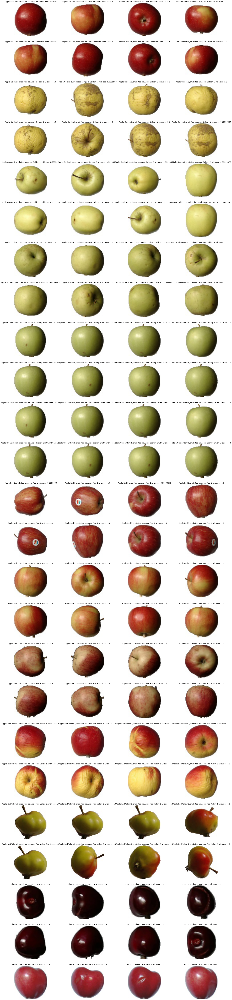

In [ ]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

nrows = 25
ncols = 4 

pic_index = 0

fig = plt.gcf()
fig.set_size_inches(ncols * 8, nrows * 6)

pic_index += 8
val_appleB_pix = [os.path.join(val_appleB_dir, fname) 
                for fname in os.listdir(val_appleB_dir)[pic_index-8:pic_index]]
val_appleG1_pix = [os.path.join(val_appleG1_dir, fname) 
                for fname in os.listdir(val_appleG1_dir)[pic_index-8:pic_index]]
val_appleG2_pix = [os.path.join(val_appleG2_dir, fname) 
                for fname in os.listdir(val_appleG2_dir)[pic_index-8:pic_index]]
val_appleG3_pix = [os.path.join(val_appleG3_dir, fname) 
                for fname in os.listdir(val_appleG3_dir)[pic_index-8:pic_index]]
val_appleGS_pix = [os.path.join(val_appleGS_dir, fname) 
                for fname in os.listdir(val_appleGS_dir)[pic_index-8:pic_index]]
val_appleR1_pix = [os.path.join(val_appleR1_dir, fname) 
                for fname in os.listdir(val_appleR1_dir)[pic_index-8:pic_index]]
val_appleR2_pix = [os.path.join(val_appleR2_dir, fname) 
                for fname in os.listdir(val_appleR2_dir)[pic_index-8:pic_index]]
val_appleR3_pix = [os.path.join(val_appleR3_dir, fname) 
                for fname in os.listdir(val_appleR3_dir)[pic_index-8:pic_index]]
val_appleRD_pix = [os.path.join(val_appleRD_dir, fname) 
                for fname in os.listdir(val_appleRD_dir)[pic_index-8:pic_index]]
val_appleRY1_pix = [os.path.join(val_appleRY1_dir, fname) 
                for fname in os.listdir(val_appleRY1_dir)[pic_index-8:pic_index]]
val_appleRY2_pix = [os.path.join(val_appleRY2_dir, fname) 
                for fname in os.listdir(val_appleRY2_dir)[pic_index-8:pic_index]]
val_cherry1_pix = [os.path.join(val_cherry1_dir, fname) 
                for fname in os.listdir(val_cherry1_dir)[pic_index-8:pic_index]]
val_cherry2_pix = [os.path.join(val_cherry2_dir, fname) 
                for fname in os.listdir(val_cherry2_dir)[pic_index-8:pic_index]]
val_cherryR_pix = [os.path.join(val_cherryR_dir, fname) 
                for fname in os.listdir(val_cherryR_dir)[pic_index-8:pic_index]]
val_cherryWB_pix = [os.path.join(val_cherryWB_dir, fname) 
                for fname in os.listdir(val_cherryWB_dir)[pic_index-8:pic_index]]
val_cherryWR_pix = [os.path.join(val_cherryWR_dir, fname) 
                for fname in os.listdir(val_cherryWR_dir)[pic_index-8:pic_index]]
val_cherryWY_pix = [os.path.join(val_cherryWY_dir, fname) 
                for fname in os.listdir(val_cherryWY_dir)[pic_index-8:pic_index]]
val_grapeB_pix = [os.path.join(val_grapeB_dir, fname) 
                for fname in os.listdir(val_grapeB_dir)[pic_index-8:pic_index]]
val_grapeP_pix = [os.path.join(val_grapeP_dir, fname) 
                for fname in os.listdir(val_grapeP_dir)[pic_index-8:pic_index]]
val_grapeW_pix = [os.path.join(val_grapeW_dir, fname) 
                for fname in os.listdir(val_grapeW_dir)[pic_index-8:pic_index]]
val_grapeW2_pix = [os.path.join(val_grapeW2_dir, fname) 
                for fname in os.listdir(val_grapeW2_dir)[pic_index-8:pic_index]]
val_grapeW3_pix = [os.path.join(val_grapeW3_dir, fname) 
                for fname in os.listdir(val_grapeW3_dir)[pic_index-8:pic_index]]
val_grapeW4_pix = [os.path.join(val_grapeW4_dir, fname) 
                for fname in os.listdir(val_grapeW4_dir)[pic_index-8:pic_index]]
val_grapefruitP_pix = [os.path.join(val_grapefruitP_dir, fname) 
                for fname in os.listdir(val_grapefruitP_dir)[pic_index-8:pic_index]]
val_grapefruitW_pix = [os.path.join(val_grapefruitW_dir, fname) 
                for fname in os.listdir(val_grapefruitW_dir)[pic_index-8:pic_index]]

for i, img_path in enumerate(val_appleB_pix[0:8]+val_appleG1_pix[0:8]+val_appleG2_pix[0:8]+val_appleG3_pix[0:8]+
                             val_appleGS_pix[0:8]+val_appleGS_pix[0:8]+val_appleR1_pix[0:8]+val_appleR2_pix[0:8]+
                             val_appleR3_pix[0:8]+val_appleRY1_pix[0:8]+val_appleRY2_pix[0:8]+val_cherry1_pix[0:8]+
                             val_cherry2_pix[0:8]+val_cherryR_pix[0:8]+val_cherryWB_pix[0:8]+val_cherryWR_pix[0:8]+
                             val_cherryWY_pix[0:8]+val_grapeB_pix[0:8]+val_grapeP_pix[0:8]+val_grapeW_pix[0:8]+val_grapeW2_pix[0:8]+
                             val_grapeW3_pix[0:8]+val_grapeW4_pix[0:8]+val_grapefruitP_pix[0:8]+val_grapefruitW_pix[0:8]):
  # Set up subplot; subplot indices start at 1
  if i == nrows * ncols:
    break
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.set_title(os.path.basename(os.path.dirname(img_path)) + predicts(img_path))
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

In [ ]:
model.save('CNN1_KelompokML.h5')

In [ ]:
files.download('CNN1_KelompokML.h5')